<center>
    
# [Компьютерное зрение](https://cogmodel.mipt.ru/wiki/index.php/%D0%9A%D0%BE%D0%BC%D0%BF%D1%8C%D1%8E%D1%82%D0%B5%D1%80%D0%BD%D0%BE%D0%B5_%D0%B7%D1%80%D0%B5%D0%BD%D0%B8%D0%B5)

## <center> Семинар 2 - Демозаикинг

<a target="_blank" href="https://colab.research.google.com/github/alexmelekhin/cv_course_2023/blob/main/seminars/seminar_02/Seminar_2_demosaicing.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

***

In [94]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [95]:
# if not installed
!pip install colour-demosaicing==0.2.2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [96]:
# нужно, чтобы cv2 открывал exr изображения
import os
os.environ["OPENCV_IO_ENABLE_OPENEXR"]="1"

In [97]:
from pathlib import Path

import cv2

import colour

from colour_demosaicing import (
    demosaicing_CFA_Bayer_bilinear,
    demosaicing_CFA_Bayer_Malvar2004,
    demosaicing_CFA_Bayer_Menon2007,
    mosaicing_CFA_Bayer)

import matplotlib.pyplot as plt
import numpy as np

In [98]:
LIGHTHOUSE_IMG_PATH = "data/lighthouse.exr"

if not Path(LIGHTHOUSE_IMG_PATH).exists():
    !git clone https://github.com/alexmelekhin/cv_course_2023.git
    !mv cv_course_2023/seminars/seminar_02/data .

In [99]:
rgb_img = cv2.imread(LIGHTHOUSE_IMG_PATH, cv2.IMREAD_UNCHANGED)[:, :, ::-1]
rgb_img = colour.cctf_encoding(rgb_img)
rgb_img.dtype

dtype('float64')

In [100]:
rgb_img.shape

(768, 512, 3)

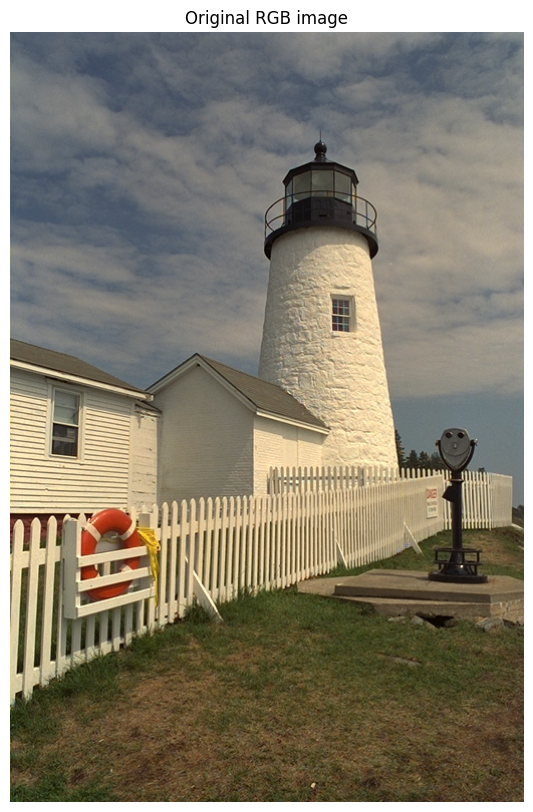

In [101]:
plt.figure(figsize=[10, 10])
plt.axis("off")
plt.title("Original RGB image")
plt.imshow(rgb_img)

In [102]:
mosaiced_image = mosaicing_CFA_Bayer(rgb_img, pattern="RGGB")
mosaiced_image.shape

(768, 512)

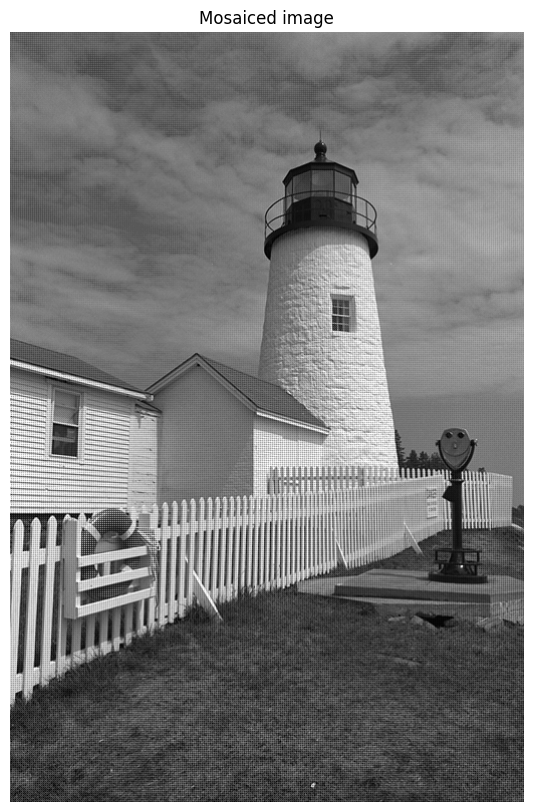

In [103]:
plt.figure(figsize=[10, 10])
plt.axis("off")
plt.title("Mosaiced image")
plt.imshow(mosaiced_image, cmap="gray")

In [104]:
def separate_chanel_rggb(img):
    new_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=img.dtype)
    new_img[0::2, 0::2, 0] = img[0::2, 0::2]  # R
    new_img[0::2, 1::2, 1] = img[0::2, 1::2]  # G1
    new_img[1::2, 0::2, 1] = img[0::2, 1::2]  # G2
    new_img[1::2, 1::2, 2] = img[0::2, 1::2]  # B
    return new_img

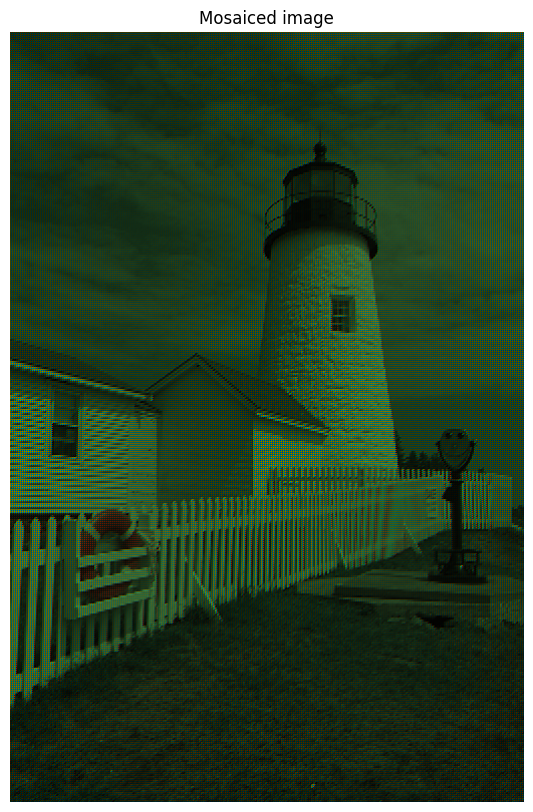

In [105]:
plt.figure(figsize=[10, 10])
plt.axis("off")
plt.title("Mosaiced image")
plt.imshow(separate_chanel_rggb(mosaiced_image))

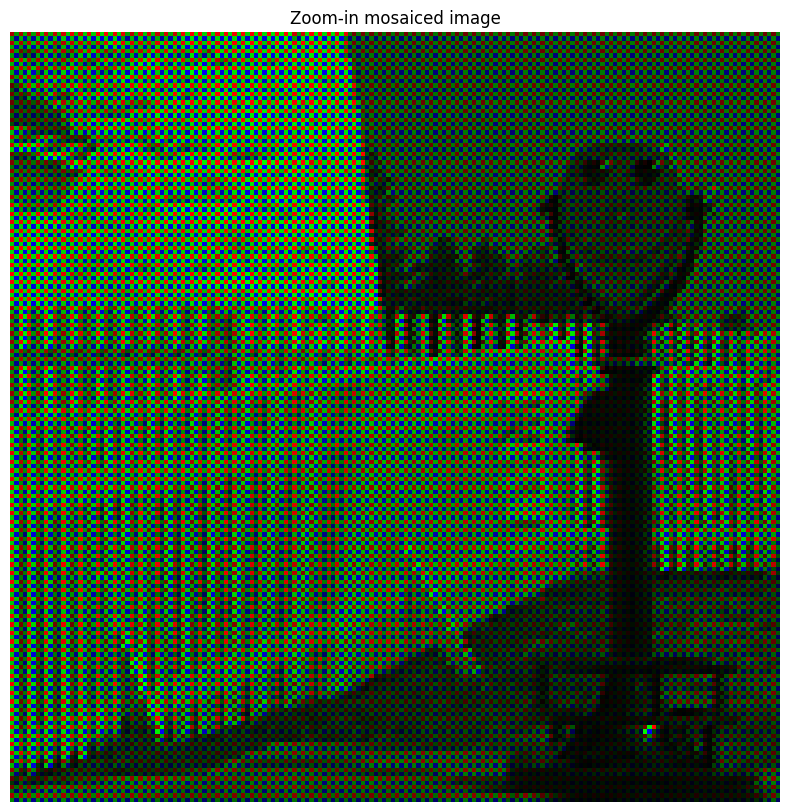

In [106]:
plt.figure(figsize=[10, 10])
plt.axis("off")
plt.title("Zoom-in mosaiced image")
plt.imshow(separate_chanel_rggb(mosaiced_image)[370:550, 300:480])

# Bilinear

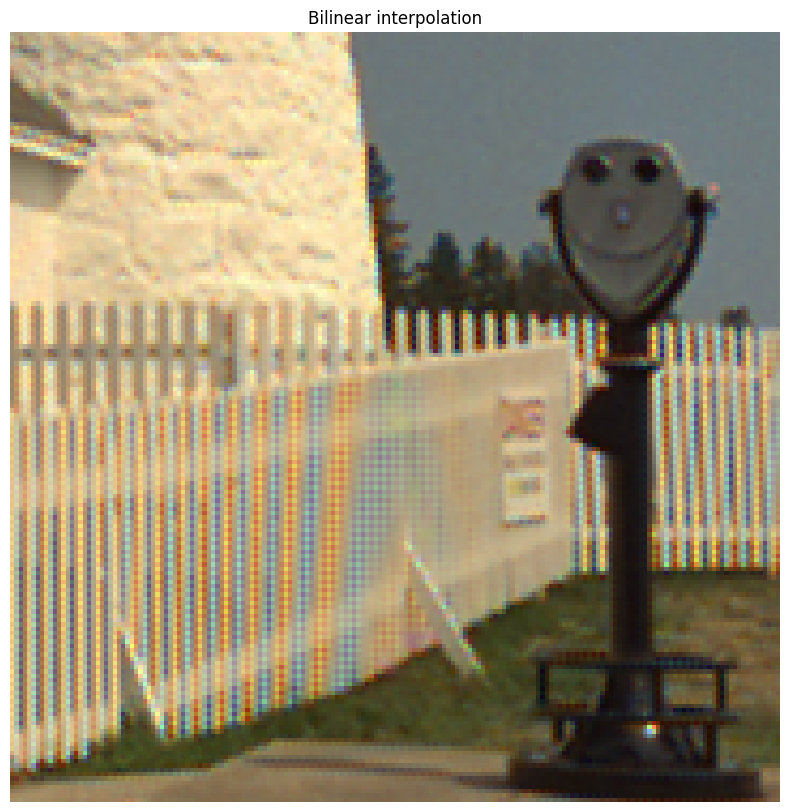

In [107]:
plt.figure(figsize=[10, 10])
plt.axis("off")
plt.title("Bilinear interpolation")
plt.imshow(demosaicing_CFA_Bayer_bilinear(mosaiced_image)[370:550, 300:480])

# Malvar (2004)

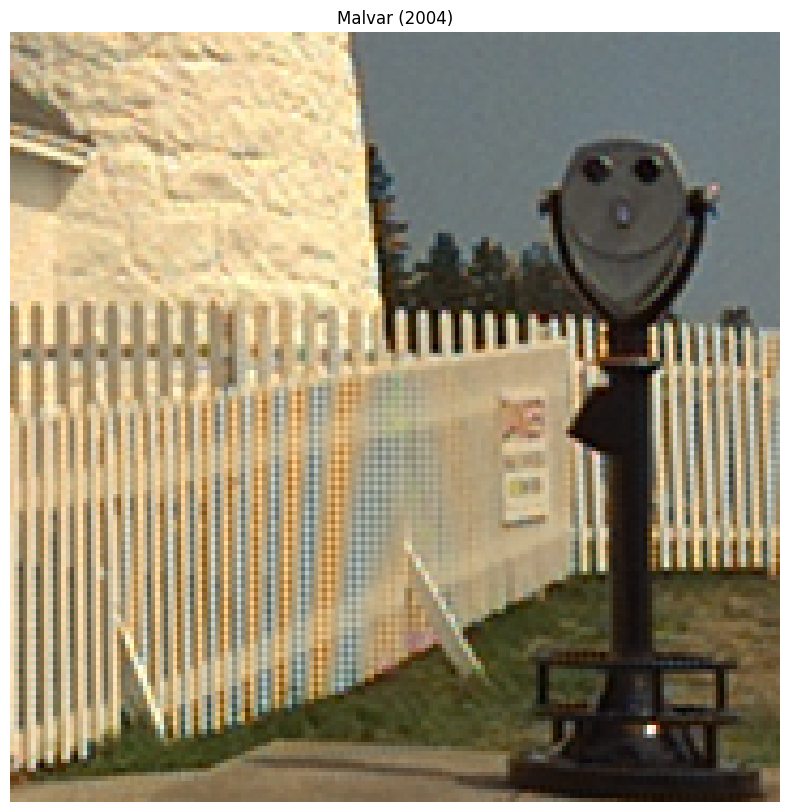

In [108]:
plt.figure(figsize=[10, 10])
plt.axis("off")
plt.title("Malvar (2004)")
plt.imshow(demosaicing_CFA_Bayer_Malvar2004(mosaiced_image)[370:550, 300:480])

# Menon (2007)

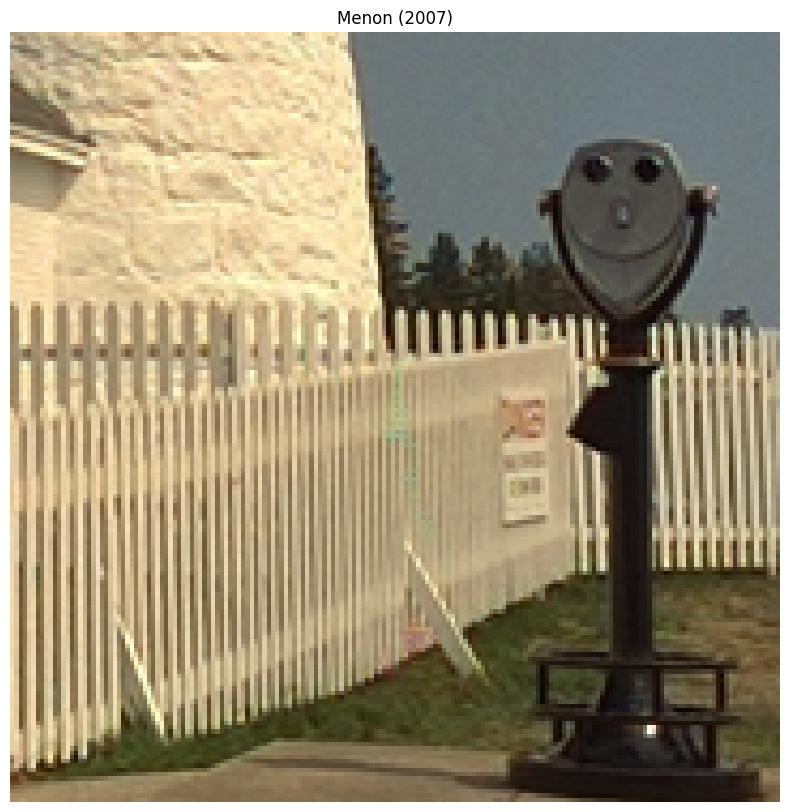

In [109]:
plt.figure(figsize=[10, 10])
plt.axis("off")
plt.title("Menon (2007)")
plt.imshow(demosaicing_CFA_Bayer_Menon2007(mosaiced_image)[370:550, 300:480])

# Домашнее задание

Вы часто будете сталкиваться с изображениями в RAW-формате при работе с индустриальными камерами и датасетами в области робототехники и беспилотного транспорта.

Например, датасет Oxford RobotCar содержит изображения в формате Bayer GBRG 8-bit (для камеры stereo).

In [110]:
OXFORD_SAMPLE_1_PATH = "data/oxford_robotcar_sample_1.png"
OXFORD_SAMPLE_2_PATH = "data/oxford_robotcar_sample_2.png"

if not Path(OXFORD_SAMPLE_1_PATH).exists():
    !git clone https://github.com/alexmelekhin/cv_course_2023.git
    !mv cv_course_2023/seminars/seminar_02/data .

In [111]:
oxford_img_1 = cv2.imread(OXFORD_SAMPLE_1_PATH, cv2.IMREAD_UNCHANGED)
oxford_img_2 = cv2.imread(OXFORD_SAMPLE_2_PATH, cv2.IMREAD_UNCHANGED)

oxford_img_1.shape, oxford_img_1.dtype

((960, 1280), dtype('uint8'))

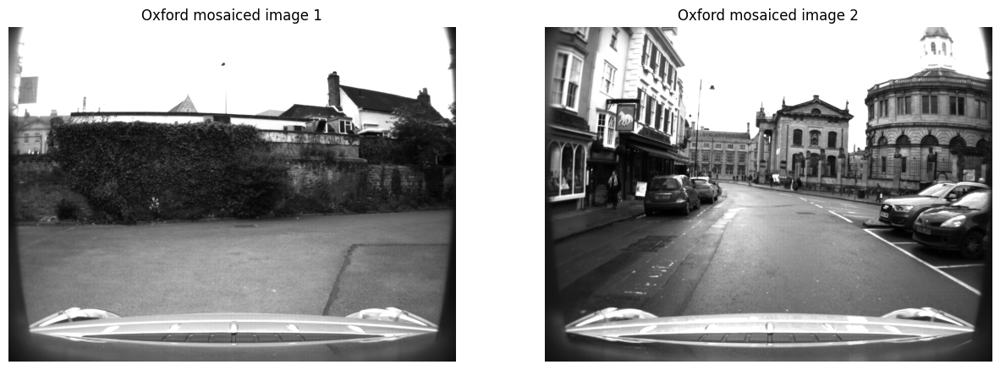

In [112]:
plt.figure(figsize=[15, 10])
plt.subplot(1, 2, 1)
plt.axis("off")
plt.title("Oxford mosaiced image 1")
plt.imshow(oxford_img_1, cmap="gray")
plt.subplot(1, 2, 2)
plt.axis("off")
plt.title("Oxford mosaiced image 2")
plt.imshow(oxford_img_2, cmap="gray")

## Задание

Попробуйте разные алгоритмы демозаикинга на изображениях из RobotCar. Найдите участки с артефактами и сравните их между собой.

In [113]:
def gbrg_to_rggb(image):
    new_image = np.zeros(image.shape)
    new_image[::2, ::2] = image[1::2, ::2]
    new_image[1::2, ::2] = image[::2, ::2]
    new_image[::2, 1::2] = image[1::2, 1::2]
    new_image[1::2, 1::2] = image[::2, 1::2]
    return new_image

In [114]:
oxford_img_1 = gbrg_to_rggb(oxford_img_1)
oxford_img_2 = gbrg_to_rggb(oxford_img_2)

In [117]:
print(oxford_img_1.shape)

(960, 1280)


<Figure size 1500x3000 with 0 Axes>

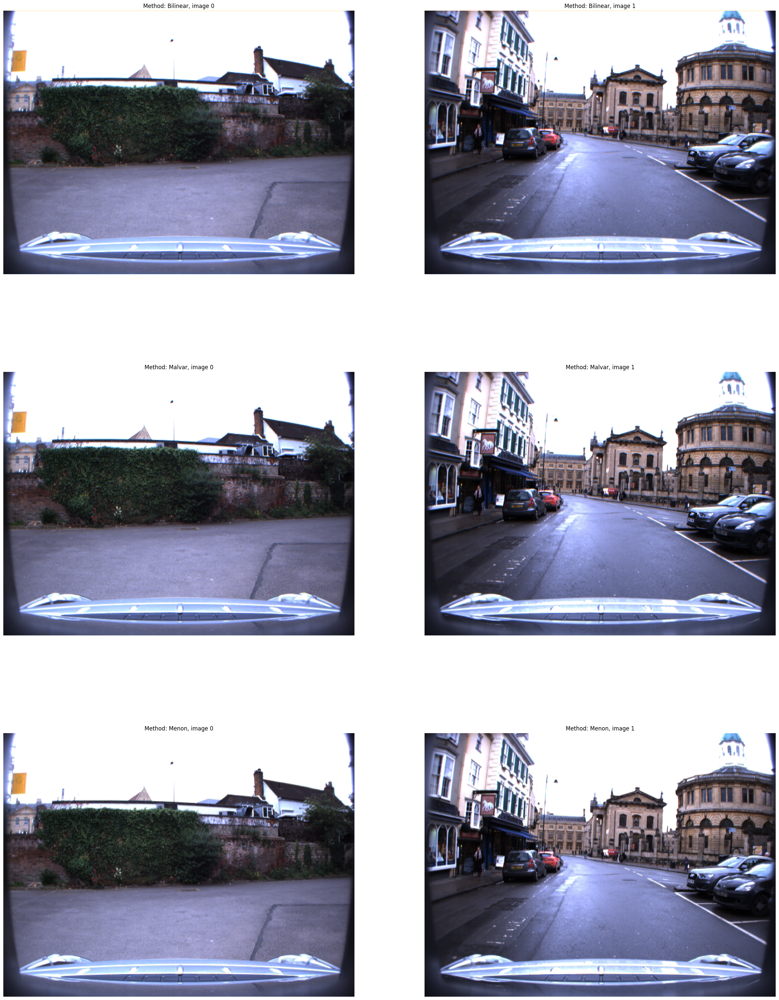

In [116]:
demosaic = {"Bilinear": demosaicing_CFA_Bayer_bilinear,
            "Malvar": demosaicing_CFA_Bayer_Malvar2004,
            "Menon": demosaicing_CFA_Bayer_Menon2007}
fig, axes = plt.subplots(3, 2)
fig.set_figwidth(30)
fig.set_figheight(40)
i=0
for name, func in demosaic.items():
    axes[i][0].axis("off"), axes[i][1].axis("off")
    axes[i][0].set_title("Method: {}, image 0".format(name))
    axes[i][1].set_title("Method: {}, image 1".format(name))
    axes[i][0].imshow(func(oxford_img_1).astype(int))
    axes[i][1].imshow(func(oxford_img_2).astype(int))
    i += 1

<Figure size 1500x3000 with 0 Axes>

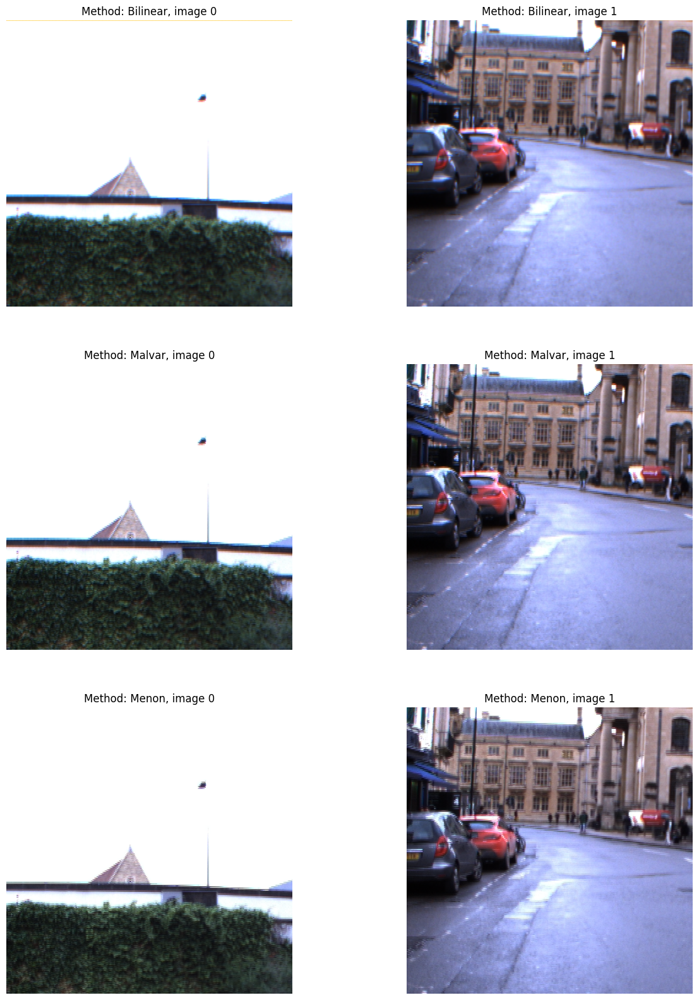

In [123]:
demosaic = {"Bilinear": demosaicing_CFA_Bayer_bilinear,
            "Malvar": demosaicing_CFA_Bayer_Malvar2004,
            "Menon": demosaicing_CFA_Bayer_Menon2007}
plt.figure(figsize=[15, 30])
fig, axes = plt.subplots(3, 2)
fig.set_figwidth(15)
fig.set_figheight(20)
i=0
for name, func in demosaic.items():
    axes[i][0].axis("off"), axes[i][1].axis("off")
    axes[i][0].set_title("Method: {}, image 0".format(name))
    axes[i][1].set_title("Method: {}, image 1".format(name))
    axes[i][0].imshow(func(oxford_img_1)[0:400, 340:740].astype(int))
    axes[i][1].imshow(func(oxford_img_2)[280:680, 340:740].astype(int))
    i += 1

На первом изображении необходимо посмотреть на флагшток (Черный кружок на палке. На первых двух изображениях этот флагшток имеет красно-зелёную "ауру", на третьем - нет. Но вместо этого там черная полоска внизу). Но, вроде, смотрится лучше. На втором изображении необходимо посмотреть на бело-красную машину справа. На первых двух изображениях аура у белой части машины имеет красноватый оттенок, на третьем такого нет. Но снова появляется какая-то непонятная полоска.